# Uber New York Data Analysis #

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os

## Data Loading and Preparation

### Loading Data

In [2]:
files = os.listdir(r'C:\Users\shail\Desktop\DA Projects\Uber Network DA\resources\uber-pickups-in-new-york-city')[-7:]
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-janjune-15.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

In [3]:
files.remove('uber-raw-data-janjune-15.csv')

In [4]:
files

['uber-raw-data-apr14.csv',
 'uber-raw-data-aug14.csv',
 'uber-raw-data-jul14.csv',
 'uber-raw-data-jun14.csv',
 'uber-raw-data-may14.csv',
 'uber-raw-data-sep14.csv']

### Data Preparation

In [5]:
path = r'C:\Users\shail\Desktop\DA Projects\Uber Network DA\resources\uber-pickups-in-new-york-city'

final = pd.DataFrame()
for file in files:
    df = pd.read_csv(path + "/" + file, encoding = 'utf-8')
    final = pd.concat([df, final])

In [6]:
final.shape

(4534327, 4)

In [7]:
df = final.copy()

In [8]:
df.head()

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512


In [9]:
df.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [12]:
# Date/Time column has datatype as object, so convert it to datetime format for analysis
df['Date/Time'] = pd.to_datetime(df['Date/Time'],format = '%m/%d/%Y %H:%M:%S')

In [13]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
dtype: object

In [14]:
df.head()

,Date/Time,Lat,Lon,Base
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512


In [15]:
df['weekday'] = df['Date/Time'].dt.day_name()

In [16]:
df['day'] = df['Date/Time'].dt.day
df['month'] = df['Date/Time'].dt.month
df['minute'] = df['Date/Time'].dt.minute
df['hour'] = df['Date/Time'].dt.hour

In [17]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,month,minute,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,9,1,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,9,1,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,9,3,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,9,6,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,9,11,0


In [18]:
df.dtypes

Date/Time    datetime64[ns]
Lat                 float64
Lon                 float64
Base                 object
weekday              object
day                   int64
month                 int64
minute                int64
hour                  int64
dtype: object

#### 1). Analysis of trips on Weekdays basis

In [19]:
# Install plotly
!pip install plotly

In [20]:
import plotly.express as px

In [24]:
px.bar(x = df['weekday'].value_counts().index,
       y = df['weekday'].value_counts())

#### From above it can be concluded that maximum no. of trips happened on Thursday

#### 2). Analysis of trips on an Hour basis

(array([216928., 103517., 227152., 543565., 324851., 366329., 819491.,
        660869., 579117., 692508.]),
 array([ 0. ,  2.3,  4.6,  6.9,  9.2, 11.5, 13.8, 16.1, 18.4, 20.7, 23. ]),
 <BarContainer object of 10 artists>)

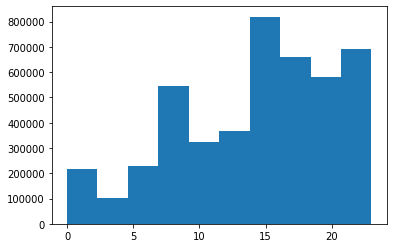

In [26]:
plt.hist(df['hour'])

#### So, trips peaks maximum during evening time( when people are logging off from work )

#### 3). Analysis of trips on Monthly basis

In [27]:
df['month'].unique()

array([9, 5, 6, 7, 8, 4], dtype=int64)

In [28]:
for i, month in enumerate(df['month'].unique()):
    print(month)

9
5
6
7
8
4


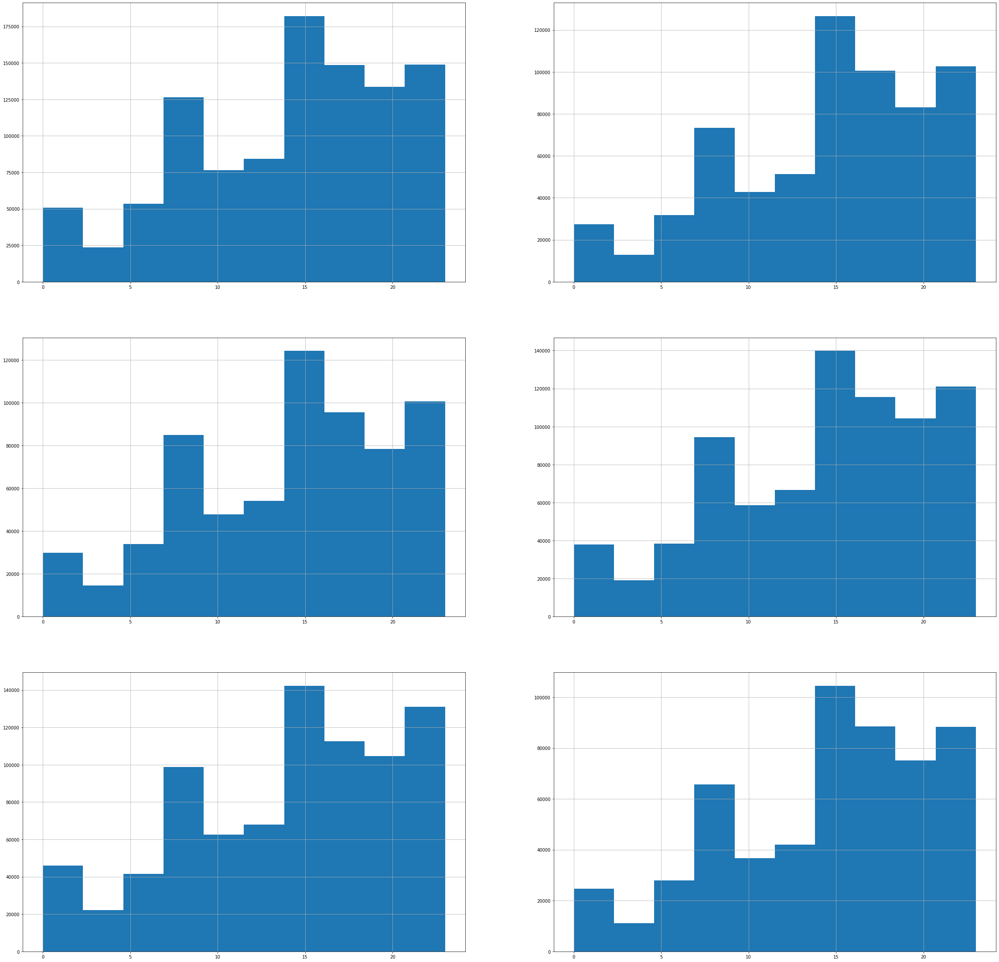

In [29]:
plt.figure(figsize = (40, 40))
for i, month in enumerate(df['month'].unique()):
    plt.subplot(3, 2, i+1)
    df[df['month'] == month]['hour'].hist()

In [30]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,month,minute,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,9,1,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,9,1,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,9,3,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,9,6,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,9,11,0


#### 4). Analyse which month has maximum rides

In [31]:
# Install chart-studio
!pip install chart-studio

In [32]:
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [33]:
trace1 = go.Bar(
    name = 'Priority',
    x = df.groupby('month')['hour'].count().index,
    y = df.groupby('month')['hour'].count()    
)

In [34]:
iplot([trace1])

#### Month 9, September has maximum rides

#### 5). Analysis of trips of Each Day of all Months
##### Ex: 1st of every month, 2nd, 3rd and so on...

#### 1st Method

Text(0.5, 1.0, 'Journeys by month day')

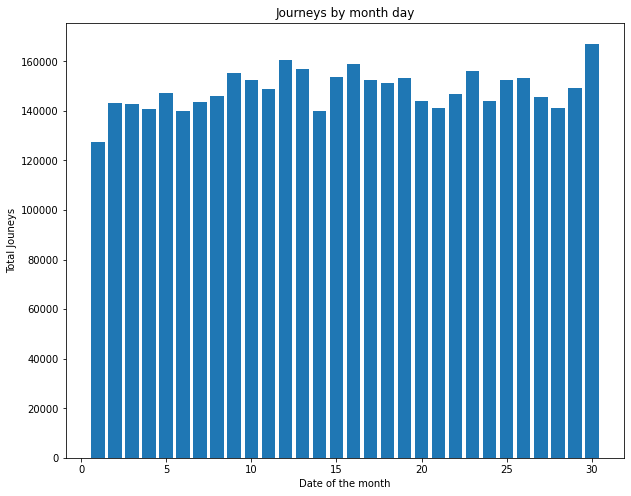

In [35]:
plt.figure(figsize = (10, 8))
plt.hist(df['day'], bins = 30, rwidth = 0.8, range = (0.5, 30.5))
plt.xlabel('Date of the month')
plt.ylabel('Total Jouneys')
plt.title('Journeys by month day')

#### 2nd Method

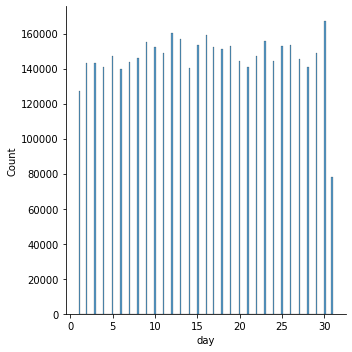

In [36]:
sns.displot(df['day'])

#### 6). Analysis of Total rides Month wise

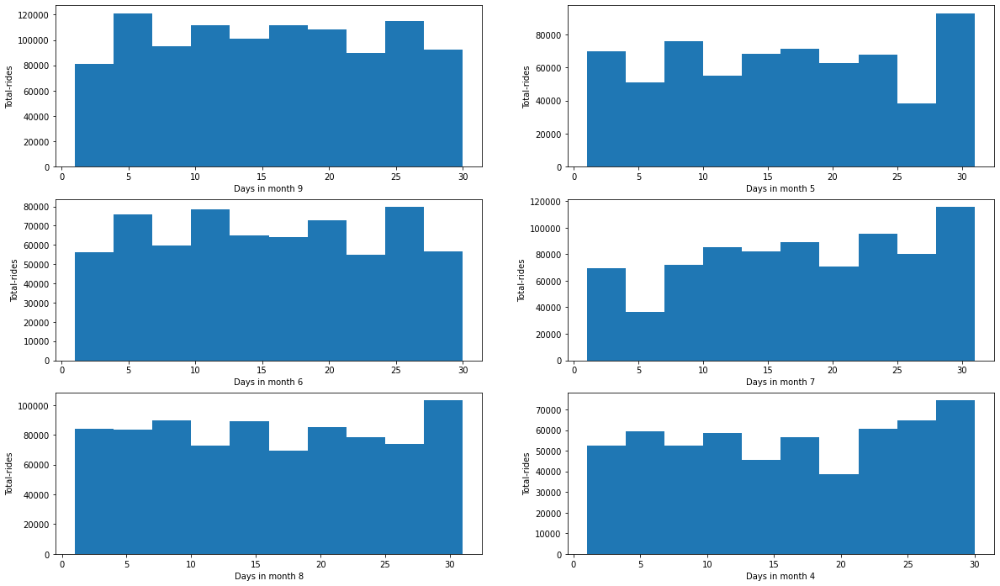

In [38]:
plt.figure(figsize = (20, 12))
for i, month in enumerate(df['month'].unique(), 1):
    plt.subplot(3, 2, i)
    df_out = df[df['month'] == month]
    plt.hist(df_out['day'])
    plt.xlabel('Days in month {}'.format(month))
    plt.ylabel('Total-rides')

#### 7). Analyse Rush in Weekdays on an Hour basis

Text(0.5, 1.0, 'hoursoffday vs latitude of passenger')

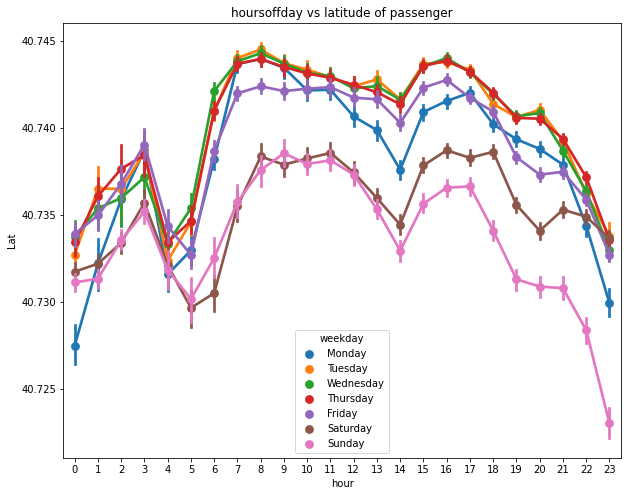

In [39]:
plt.figure(figsize = (10,8))
ax = sns.pointplot(x = 'hour', y = 'Lat', data = df, hue = 'weekday')
ax.set_title('hoursoffday vs latitude of passenger')

#### 8). Analyse which base number gets popular by month name

In [42]:
base = df.groupby(['Base','month'])['Date/Time'].count().reset_index()
base

,Base,month,Date/Time
0,B02512,4,35536
1,B02512,5,36765
2,B02512,6,32509
3,B02512,7,35021
4,B02512,8,31472
5,B02512,9,34370
6,B02598,4,183263
7,B02598,5,260549
8,B02598,6,242975
9,B02598,7,245597


<AxesSubplot:xlabel='month', ylabel='Date/Time'>

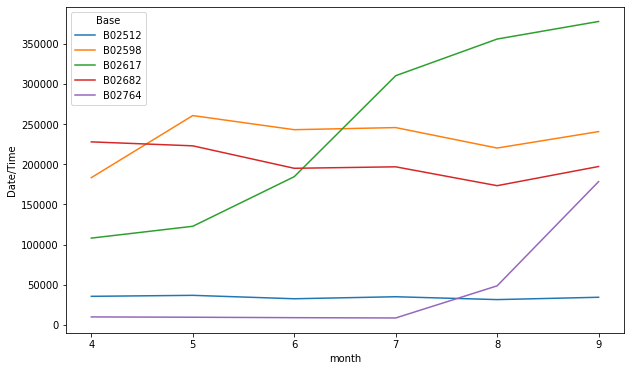

In [43]:
plt.figure(figsize = (10,6))
sns.lineplot(x = 'month', y = 'Date/Time', hue = 'Base', data = base)

#### Base No. B02617 and B02764 get popular as month increases

##### ------------------------------------------------------------------------------------------------------------

### Cross Analysis using Heatmap

#### 1). Heatmap by Hour and Weekday

In [44]:
def count_rows(rows):
    return len(rows)

In [45]:
by_cross = df.groupby(['weekday', 'hour']).apply(count_rows)
by_cross

weekday    hour
Friday     0       13716
           1        8163
           2        5350
           3        6930
           4        8806
                   ...  
Wednesday  19      47017
           20      47772
           21      44553
           22      32868
           23      18146
Length: 168, dtype: int64

In [46]:
pivot = by_cross.unstack()
pivot

hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,
Friday,13716,8163,5350,6930,8806,13450,23412,32061,31509,25230,...,36206,43673,48169,51961,54762,49595,43542,48323,49409,41260
Monday,6436,3737,2938,6232,9640,15032,23746,31159,29265,22197,...,28157,32744,38770,42023,37000,34159,32849,28925,20158,11811
Saturday,27633,19189,12710,9542,6846,7084,8579,11014,14411,17669,...,31418,38769,43512,42844,45883,41098,38714,43826,47951,43174
Sunday,32877,23015,15436,10597,6374,6169,6596,8728,12128,16401,...,28151,31112,33038,31521,28291,25948,25076,23967,19566,12166
Thursday,9293,5290,3719,5637,8505,14169,27065,37038,35431,27812,...,36699,44442,50560,56704,55825,51907,51990,51953,44194,27764
Tuesday,6237,3509,2571,4494,7548,14241,26872,36599,33934,25023,...,34846,41338,48667,55500,50186,44789,44661,39913,27712,14869
Wednesday,7644,4324,3141,4855,7511,13794,26943,36495,33826,25635,...,35148,43388,50684,55637,52732,47017,47772,44553,32868,18146


<AxesSubplot:xlabel='hour', ylabel='weekday'>

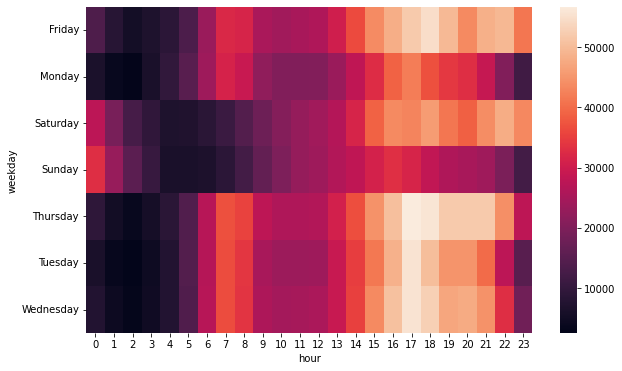

In [47]:
plt.figure(figsize = (10, 6))
sns.heatmap(pivot)

#### Create a function and pass arguments to see heatmap of different attributes

In [48]:
def heatmap(col1, col2):
    by_cross = df.groupby([col1, col2]).apply(count_rows)
    pivot = by_cross.unstack()
    plt.figure(figsize = (10, 6))
    return sns.heatmap(pivot)

#### 2). Heatmap by Hour and Day

<AxesSubplot:xlabel='hour', ylabel='day'>

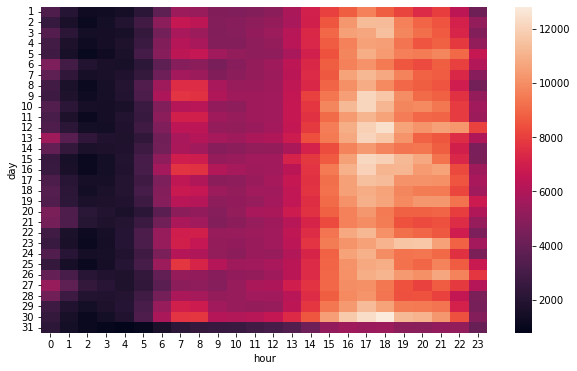

In [49]:
heatmap('day', 'hour')

#### 3). Heatmap by Month and Day

<AxesSubplot:xlabel='month', ylabel='day'>

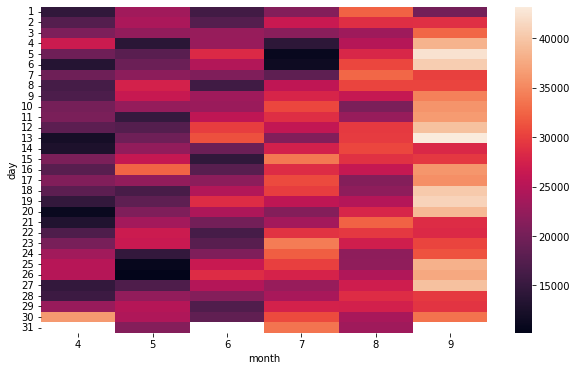

In [52]:
heatmap('day', 'month')

#### 4). Heatmap by Month and Weekday

<AxesSubplot:xlabel='month', ylabel='weekday'>

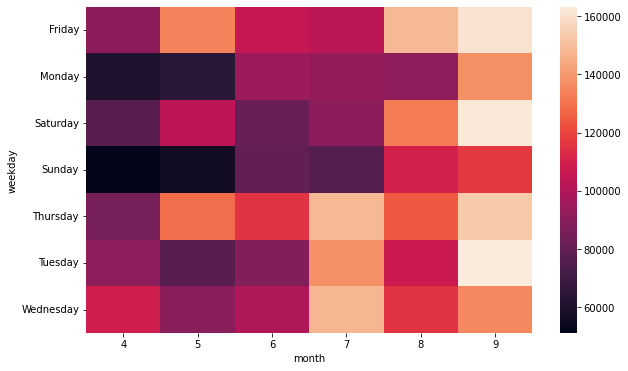

In [53]:
heatmap('weekday', 'month')

In [54]:
df.head()

,Date/Time,Lat,Lon,Base,weekday,day,month,minute,hour
0,2014-09-01 00:01:00,40.2201,-74.0021,B02512,Monday,1,9,1,0
1,2014-09-01 00:01:00,40.7500,-74.0027,B02512,Monday,1,9,1,0
2,2014-09-01 00:03:00,40.7559,-73.9864,B02512,Monday,1,9,3,0
3,2014-09-01 00:06:00,40.7450,-73.9889,B02512,Monday,1,9,6,0
4,2014-09-01 00:11:00,40.8145,-73.9444,B02512,Monday,1,9,11,0


#### Analysis of Location data points

(40.6, 41.0)

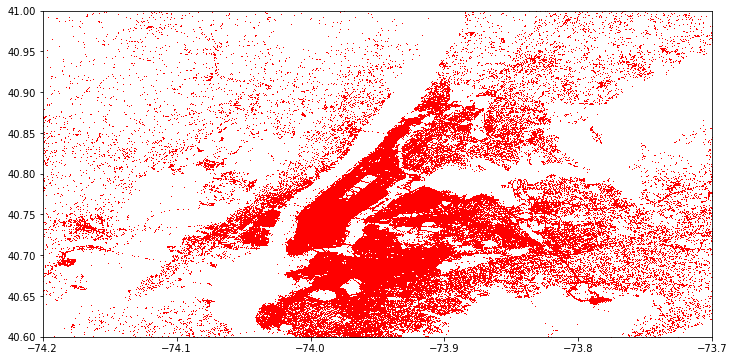

In [55]:
plt.figure(figsize = (12,6))
plt.plot(df['Lon'], df['Lat'], 'r+', ms = 0.5)
plt.xlim(-74.2, -73.7)
plt.ylim(40.6, 41)

#### As we can see a number of hot spots here. Midtown Manhattan is clearly a huge bright spot.
#### These are made from Midtown to Lower Manhattan.
#### Followed by Upper Manhattan and the Heights of Brooklyn.
#### ---------------------------------------------------------------------------------------------------------------------------------

#### Perform Spatial Analysis using heatmap to get a clear vision of Rush on Sunday(Weekend)

In [56]:
df_out = df[df['weekday'] == 'Sunday']

In [57]:
df_out.shape

(490180, 9)

In [58]:
df_out.head()

,Date/Time,Lat,Lon,Base,weekday,day,month,minute,hour
8011,2014-09-07 00:00:00,40.7341,-74.0005,B02512,Sunday,7,9,0,0
8012,2014-09-07 00:00:00,40.7344,-73.9900,B02512,Sunday,7,9,0,0
8013,2014-09-07 00:00:00,40.7806,-73.9582,B02512,Sunday,7,9,0,0
8014,2014-09-07 00:01:00,40.7293,-73.9859,B02512,Sunday,7,9,1,0
8015,2014-09-07 00:01:00,40.7713,-74.0133,B02512,Sunday,7,9,1,0


In [59]:
rush = df_out.groupby(['Lat', 'Lon'])['weekday'].count().reset_index()
rush.columns = ['Lat', 'Lon', 'No. of trips']
rush

,Lat,Lon,No. of trips
0,39.9374,-74.0722,1
1,39.9378,-74.0721,1
2,39.9384,-74.0742,1
3,39.9385,-74.0734,1
4,39.9415,-74.0736,1
...,...,...,...
209225,41.3141,-74.1249,1
209226,41.3180,-74.1298,1
209227,41.3195,-73.6905,1
209228,41.3197,-73.6903,1


In [60]:
# Install folium
!python -m pip install folium

In [63]:
import folium
from folium.plugins import HeatMap

In [64]:
basemap = folium.Map()

In [65]:
HeatMap(rush, zoom = 20, radius = 15).add_to(basemap)
basemap

#### Perform Spatial Analysis on other days also by creating a function

In [66]:
def plot(df, day):
    basemap = folium.Map()
    df_out = df[df['weekday'] == day]
    HeatMap(df_out.groupby(['Lat', 'Lon'])['weekday'].count().reset_index(), zoom = 20, radius = 15).add_to(basemap)
    return basemap

In [67]:
plot(df,'Saturday')

### Now perform Analysis on Jan-June uber_15 file

In [68]:
uber_15 = pd.read_csv(r'C:\Users\shail\Desktop\DA Projects\Uber Network DA\resources\uber-pickups-in-new-york-city\uber-raw-data-janjune-15.csv')

In [69]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID
0,B02617,2015-05-17 09:47:00,B02617,141
1,B02617,2015-05-17 09:47:00,B02617,65
2,B02617,2015-05-17 09:47:00,B02617,100
3,B02617,2015-05-17 09:47:00,B02774,80
4,B02617,2015-05-17 09:47:00,B02617,90


In [70]:
uber_15.dtypes

Dispatching_base_num    object
Pickup_date             object
Affiliated_base_num     object
locationID               int64
dtype: object

In [72]:
# Change datatype of Pickup_date to datetime format for analysis
uber_15['Pickup_date'] = pd.to_datetime(uber_15['Pickup_date'],format = '%Y-%m-%d %H:%M:%S')

In [73]:
uber_15.dtypes

Dispatching_base_num            object
Pickup_date             datetime64[ns]
Affiliated_base_num             object
locationID                       int64
dtype: object

In [74]:
# Creating extra columns for getting better results
uber_15['weekday'] = uber_15['Pickup_date'].dt.day_name()
uber_15['day'] = uber_15['Pickup_date'].dt.day
uber_15['minute'] = uber_15['Pickup_date'].dt.minute
uber_15['month'] = uber_15['Pickup_date'].dt.month
uber_15['hour'] = uber_15['Pickup_date'].dt.hour

In [75]:
uber_15.head()

,Dispatching_base_num,Pickup_date,Affiliated_base_num,locationID,weekday,day,minute,month,hour
0,B02617,2015-05-17 09:47:00,B02617,141,Sunday,17,47,5,9
1,B02617,2015-05-17 09:47:00,B02617,65,Sunday,17,47,5,9
2,B02617,2015-05-17 09:47:00,B02617,100,Sunday,17,47,5,9
3,B02617,2015-05-17 09:47:00,B02774,80,Sunday,17,47,5,9
4,B02617,2015-05-17 09:47:00,B02617,90,Sunday,17,47,5,9


#### Uber pickups month wise in New York City(NYC)

In [76]:
px.bar(x = uber_15['month'].value_counts().index,
       y = uber_15['month'].value_counts())

#### We can see that the number of Uber pickups has been steadily increasing throughout the first half of 2015 in NYC

#### --------------------------------------------------------------------------

#### Analysing Rush hour in New york City

c:\python38\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='hour', ylabel='count'>

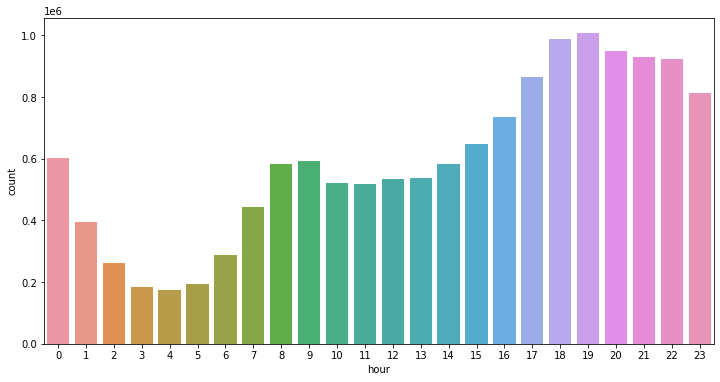

In [77]:
plt.figure(figsize = (12,6))
sns.countplot(uber_15['hour'])

#### As we can see, after the morning rush, the number of Uber pickups doesn't dip much throughout the rest of the morning and early afternoon.
#### There is significantly increase in the evening time than the daytime.
#### Let's analyse more to see if there's any difference in hourly pattern for different days of the week.

#### Analysing Rush Day & Hour wise

In [78]:
summary = uber_15.groupby(['weekday','hour'])['Pickup_date'].count().reset_index()
summary.head()

,weekday,hour,Pickup_date
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


In [79]:
summary.columns=['weekday', 'hour', 'counts']
summary.head()

,weekday,hour,counts
0,Friday,0,85939
1,Friday,1,46616
2,Friday,2,28102
3,Friday,3,19518
4,Friday,4,23575


<AxesSubplot:xlabel='hour', ylabel='counts'>

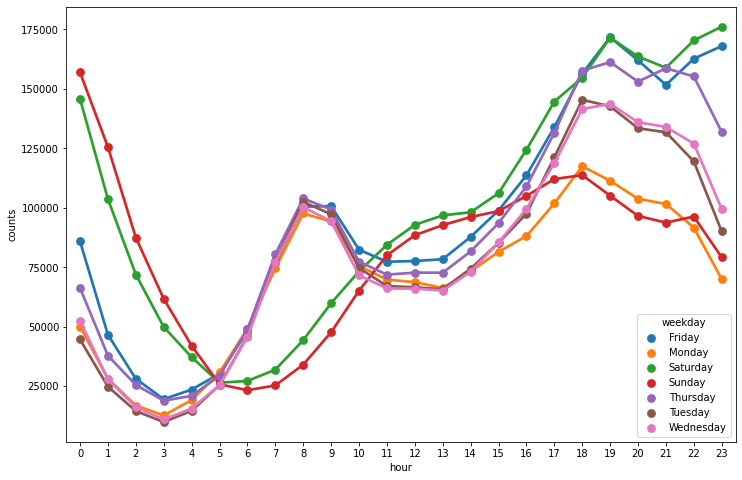

In [80]:
plt.figure(figsize = (12,8))
sns.pointplot(x = 'hour', y = 'counts', hue = 'weekday', data = summary)

### Now perform Analysis on Uber-Jan-Feb-FOIL file

In [81]:
uber_foil = pd.read_csv(r'C:\Users\shail\Desktop\DA Projects\Uber Network DA\resources\uber-pickups-in-new-york-city\Uber-Jan-Feb-FOIL.csv')

In [82]:
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips
0,B02512,1/1/2015,190,1132
1,B02765,1/1/2015,225,1765
2,B02764,1/1/2015,3427,29421
3,B02682,1/1/2015,945,7679
4,B02617,1/1/2015,1228,9537


In [83]:
uber_foil.shape

(354, 4)

In [84]:
uber_foil['dispatching_base_number'].unique()

array(['B02512', 'B02765', 'B02764', 'B02682', 'B02617', 'B02598'],
      dtype=object)

<AxesSubplot:xlabel='dispatching_base_number', ylabel='active_vehicles'>

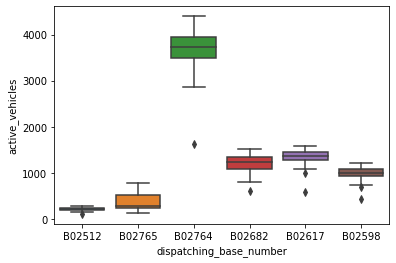

In [85]:
sns.boxplot(x = 'dispatching_base_number', y = 'active_vehicles', data = uber_foil)

#### As we can see B02764 base has more number of Active Vehicles

<AxesSubplot:xlabel='dispatching_base_number', ylabel='trips'>

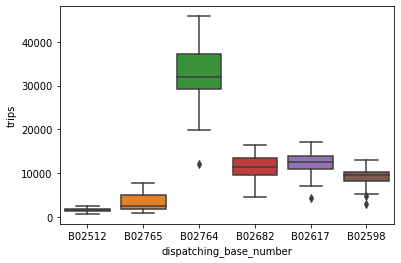

In [86]:
sns.boxplot(x = 'dispatching_base_number', y = 'trips', data = uber_foil)

#### Here also B02764 base has maximum number of trips

In [87]:
# Finding the ratio of trips/active_vehicles
uber_foil['trips/vehicle'] = uber_foil['trips'] / uber_foil['active_vehicles']
uber_foil.head()

,dispatching_base_number,date,active_vehicles,trips,trips/vehicle
0,B02512,1/1/2015,190,1132,5.957895
1,B02765,1/1/2015,225,1765,7.844444
2,B02764,1/1/2015,3427,29421,8.585060
3,B02682,1/1/2015,945,7679,8.125926
4,B02617,1/1/2015,1228,9537,7.766287


#### Analysing the average trips/vehicles increases/decreases with dates of each base number

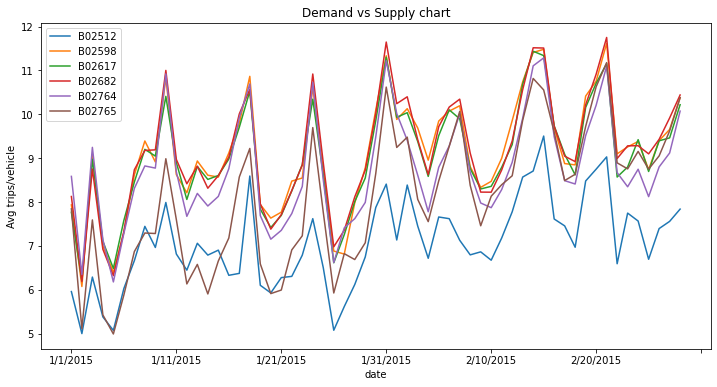

In [88]:
plt.figure(figsize = (12,6))
uber_foil.set_index('date').groupby(['dispatching_base_number'])['trips/vehicle'].plot()
plt.ylabel('Avg trips/vehicle')
plt.title('Demand vs Supply chart')
plt.legend()

#### ---------------------------------------------------------------------------------------------------------------------------------------------------------------------